In [ ]:
# default_exp eda

# Exploratory Data Analysis
> Analysis of classifcation data

In [1]:
#hide
from nbdev.showdoc import *

%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
#export
from pathlib import WindowsPath as Path
from PIL import Image, ExifTags
import matplotlib.pyplot as plt

import matplotlib.image as mpimg

from typing import *
import mimetypes
import os
import numpy as np
import cv2
import random

In [3]:
#export
image_extensions = set(k for k,v in mimetypes.types_map.items() if v.startswith('image/'))

In [7]:
#export
def listify(o):
    if o is None: return []
    if isinstance(o, list): return o
    if isinstance(o, str): return [o]
    if isinstance(o, Iterable): return list(o)
    return [o]


def setify(o): return o if isinstance(o,set) else set(listify(o))

def _get_files(p, fs, extensions=None):
    p = Path(p)
    res = [p/f for f in fs if not f.startswith('.')
           and ((not extensions) or f'.{f.split(".")[-1].lower()}' in extensions)]
    return res

def get_files(path, extensions=None, recurse=False, include=None):
    path = Path(path)
    extensions = setify(extensions)
    extensions = {e.lower() for e in extensions}
    if recurse:
        res = []
        for i,(p,d,f) in enumerate(os.walk(path)): # returns (dirpath, dirnames, filenames)
            if include is not None and i==0: d[:] = [o for o in d if o in include]
            else:                            d[:] = [o for o in d if not o.startswith('.')]
            res += _get_files(p, f, extensions)
        return res
    else:
        f = [o.name for o in os.scandir(path) if o.is_file()]
        return _get_files(path, f, extensions)

In [8]:
#hide
path = Path('D:/_DATA/deer/images/test/')

In [9]:
img_files = get_files(path, extensions=image_extensions, recurse=True)

In [10]:
img_files[0]

WindowsPath('D:/_DATA/deer/images/test/20/DCIM/101RECNX/IMG_0001.JPG')

## Batch of images

Let's start by grabbing some of the images from our unorganized dataset and taking a look at them.

In [11]:
def show_images(images, cols = 1, titles = None):
    """Display a list of images in a single figure with matplotlib.

    images: List of np.arrays compatible with plt.imshow.
    
    cols (Default = 1): Number of columns in figure (number of rows is 
                        set to np.ceil(n_images/float(cols))).
    """
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: 
        titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    
    fig = plt.figure()
    
    for n, (i, title) in enumerate(zip(images, titles)):
        image = mpimg.imread(i)
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()

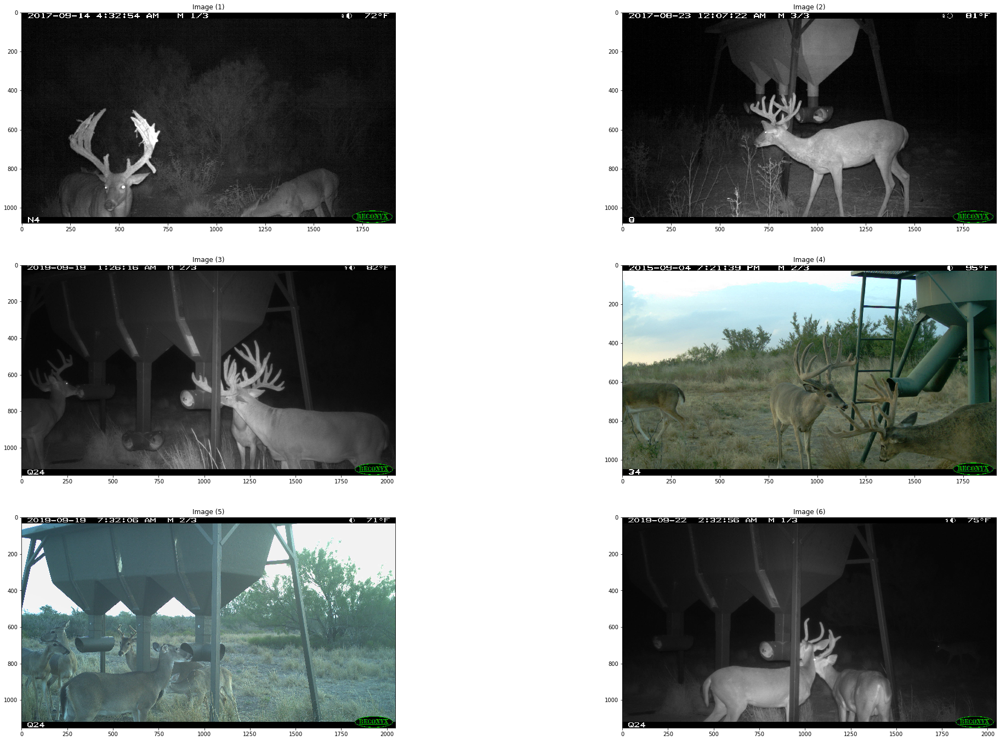

In [12]:
show_images(random.choices(img_files, k=6), 3)

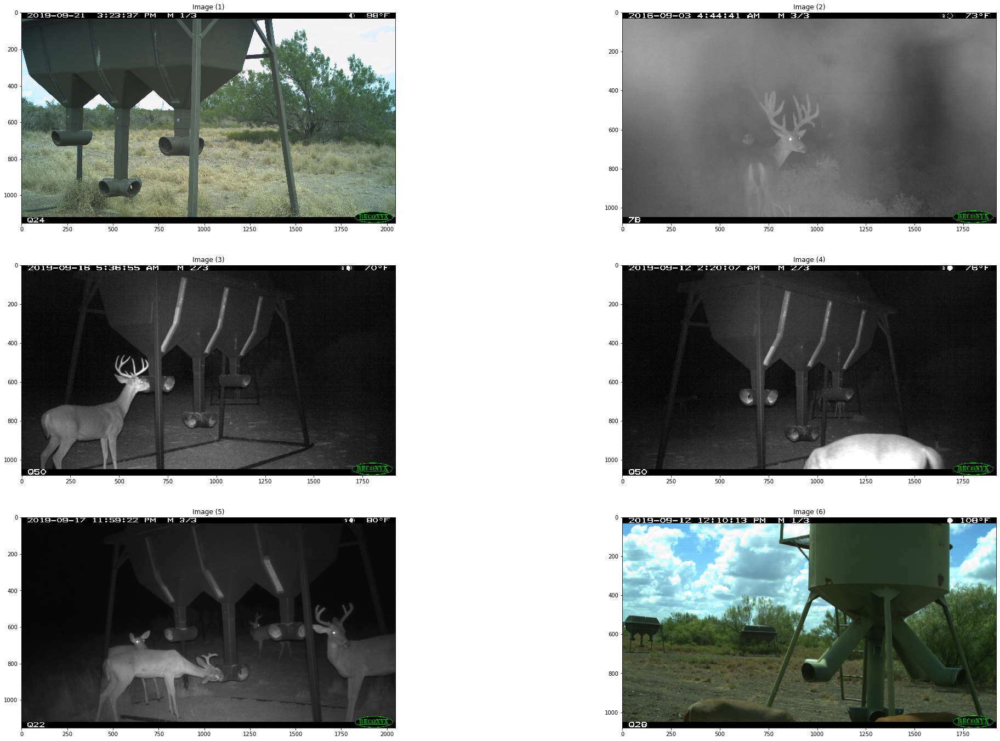

In [13]:
show_images(random.choices(img_files, k=6), 3)

Our goal here is to classify these images by the presence or absence of certain types of deer.

Looking at these random selections its clear that while some features are consistent, like the feeder structures, there is a good amount of variety in how the deer appear.  

A few appear to have no deer present, some just a quarter or half. Some of the animals are close and others in the background. Some are clearly taken in the day while others at night. 

Basically, these image have large variations in size, rotation and position of the animals (objects of interest). 

## Metadata

Now we'll look at some individual files and see what metadata we can collect that might be useful.

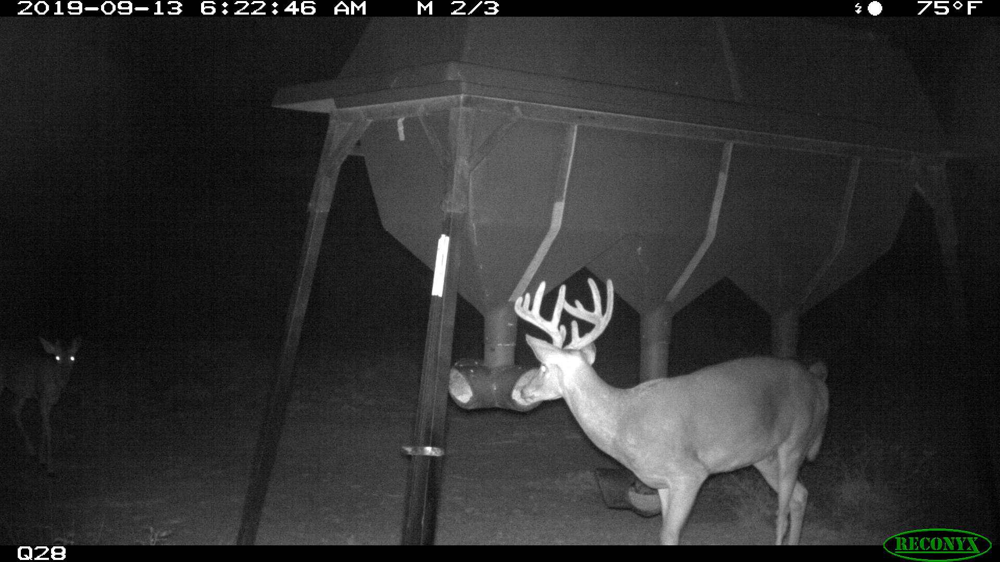

In [14]:
night = Image.open(img_files[466]); night

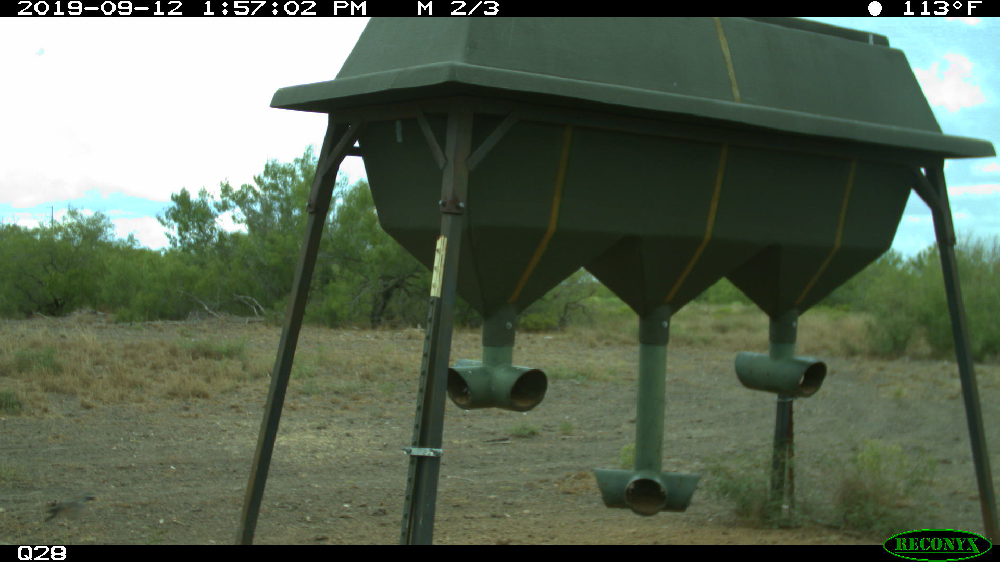

In [15]:
day = Image.open(img_files[1]); day

In [16]:
day_exif = { ExifTags.TAGS[k]: v for k, v in day._getexif().items() if k in ExifTags.TAGS }
night_exif = { ExifTags.TAGS[k]: v for k, v in night._getexif().items() if k in ExifTags.TAGS }

In [17]:
day_exif.keys()

dict_keys(['ExifVersion', 'ComponentsConfiguration', 'FlashPixVersion', 'DateTimeOriginal', 'DateTimeDigitized', 'ColorSpace', 'ExifImageWidth', 'ExifImageHeight', 'ExposureMode', 'Flash', 'WhiteBalance', 'SceneCaptureType', 'Make', 'Model', 'YCbCrPositioning', 'ExposureTime', 'XResolution', 'YResolution', 'ISOSpeedRatings', 'ResolutionUnit', 'ExifOffset', 'DateTime', 'MakerNote'])

In [18]:
for k in day_exif.keys():
    if k != 'MakerNote':
        print(f'{k} :' , f'{day_exif[k]}'.rjust(45-len(k)),f'{night_exif[k]}'.rjust(35))

ExifVersion :                            b'0220'                             b'0220'
ComponentsConfiguration :    b'\x01\x02\x03\x00'                 b'\x01\x02\x03\x00'
FlashPixVersion :                        b'0100'                             b'0100'
DateTimeOriginal :           2019:09:12 13:57:02                 2019:09:13 06:22:46
DateTimeDigitized :          2019:09:12 13:57:02                 2019:09:13 06:22:46
ColorSpace :                                   1                                   1
ExifImageWidth :                            1920                                1920
ExifImageHeight :                           1080                                1080
ExposureMode :                                 0                                   0
Flash :                                       24                                  25
WhiteBalance :                                 1                                   1
SceneCaptureType :                             0                 

The tag `SceneCaptureType` indicates the type of scene that was shot.

- 0 = Standard
- 1 = Landscape
- 2 = Portrait
- 3 = Night scene

This will allow us to quicky and easily sort the images into `night` and `day`

## Nightmode

The images shot in nightmode turn out to be 3 channels - just like the full color day images.

In [19]:
night_a = np.array(night)

In [20]:
night_a.shape

(1080, 1920, 3)

Though there are 3 channels they appear to be nearly identical.

In [21]:
np.linalg.norm(night_a[:,:,0]), np.linalg.norm(night_a[:,:,1]), np.linalg.norm(night_a[:,:,2])

(90411.33291241757, 90905.57324498867, 90411.84228296645)

This is not the case with the color images.

In [22]:
day_a = np.array(day)
np.linalg.norm(day_a [:,:,0]), np.linalg.norm(day_a [:,:,1]), np.linalg.norm(day_a [:,:,2])

(165157.30932962065, 180946.88702213144, 164091.95304462677)

We can open the image with only one channel to confirm that they are basically identical except for the logo in the bottom right. 

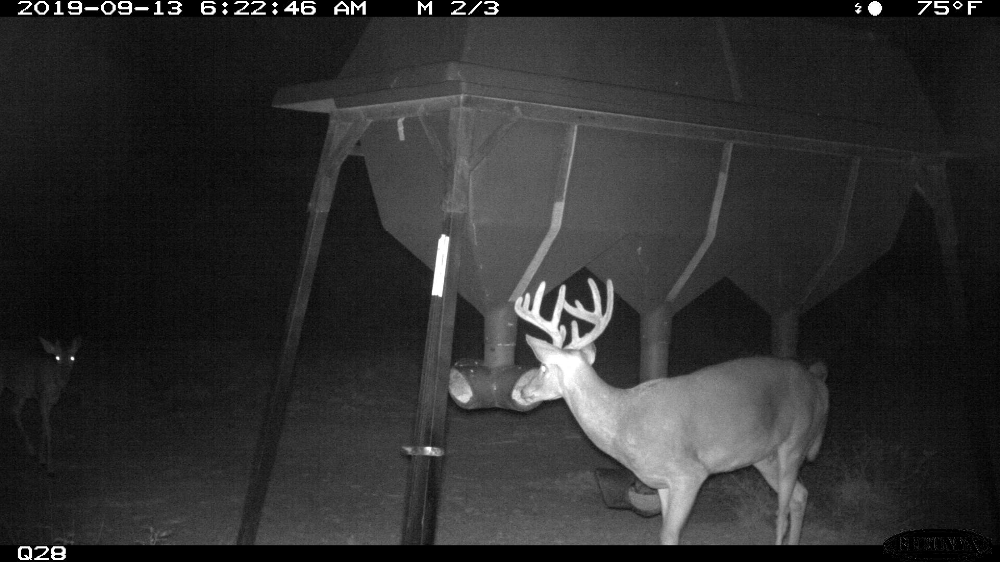

In [23]:
Image.fromarray(night_a[:,:,0], mode='L')

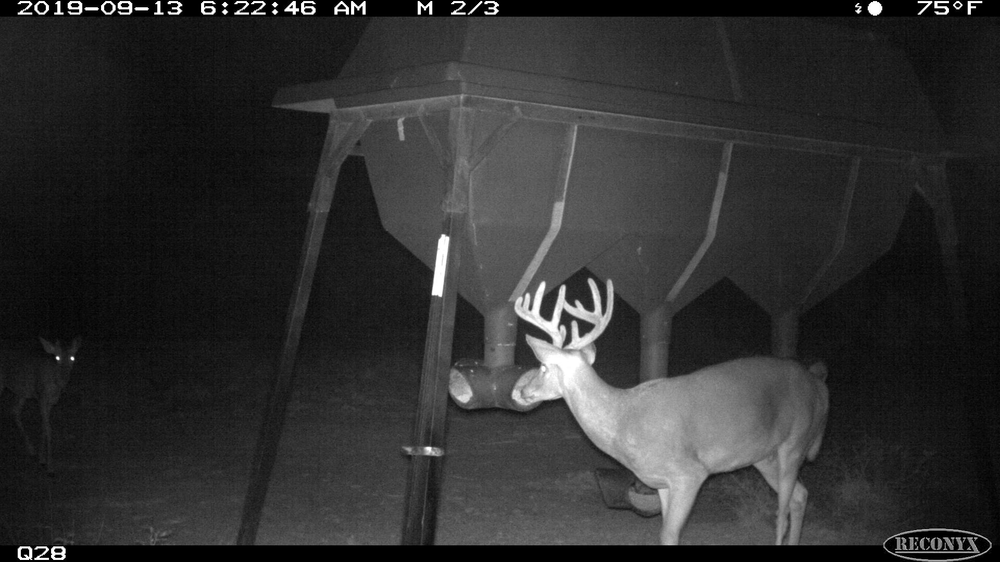

In [24]:
Image.fromarray(night_a[:,:,1], mode='L')

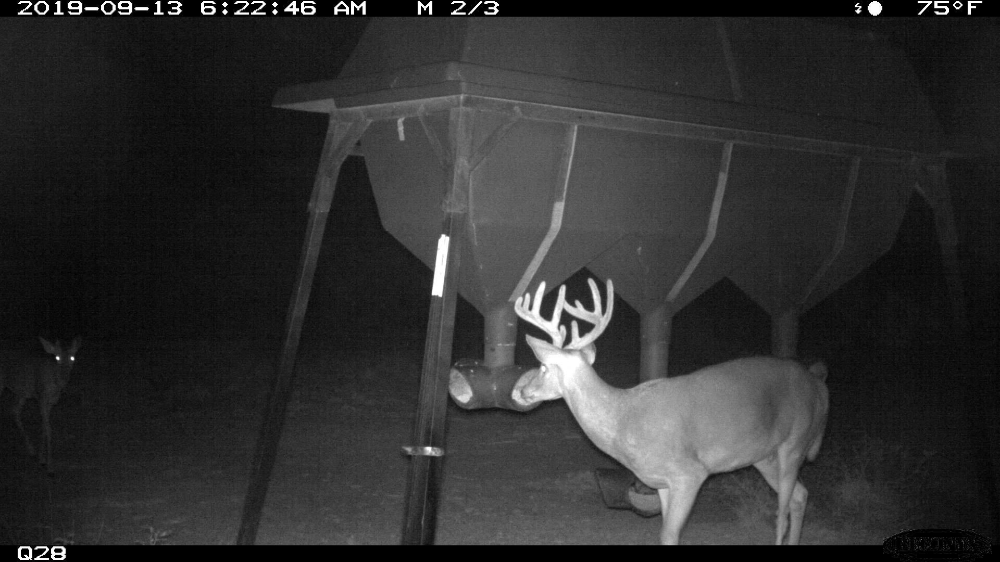

In [25]:
Image.fromarray(night_a[:,:,2], mode='L', )

## Distributions

To get an idea of the intensity distributions of `night` vs `day` let's create histograms.

We'll bin the image pixels into 256 bins and plot them along the x axis. 

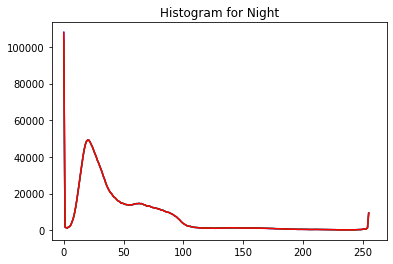

In [30]:
night = cv2.imread(img_files[466].as_posix())
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([night],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([-10,270])
plt.title('Histogram for Night')
plt.show()

This histogram demonstrations what we observed above which is that nearly all of the channels are identical in the night image. 

The majority of the colors are found at black (#000000).

And there is a significant amount to be found in the grey range that peaks around 25. 

At the very end we can see a cluster of white.

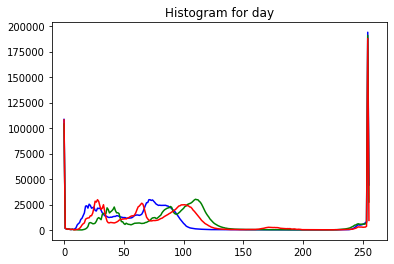

In [28]:
day = cv2.imread(img_files[0].as_posix())
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([day],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([-10,270])
plt.title('Histogram for day')
plt.show()

The tonal range of the day image gives us less information.

## Conclusion

Based on the analysis above we'll assume we need at least two distinct sets of models: one for night and one for day. 

We can start the sorting process by using the metadata to separate the images into night and day. 

In [2]:
#hide
from nbdev.export import notebook2script
notebook2script()

Converted 01_eda.ipynb.
Converted 02_labelling.ipynb.
Converted index.ipynb.


In [3]:
#hide
from nbdev.export2html import notebook2html
notebook2html()

No notebooks were modified
